## Error Correction Spontaneous Magnetization 

Identify and correct systematic biases in DFT-based simulations of spontaneous magnetization (Ms), using a combination of:

- Statistical modeling of error patterns
- AI-driven correction functions
- Data augmentation for missing experimental values

[TODO] add description of EC models.

In [1]:
import sys
from pathlib import Path
import os

# Get project root (parent of notebooks/)
PROJECT_ROOT = Path.cwd().parent.resolve()

# Add project root to Python path so src/ is importable
sys.path.insert(0, str(PROJECT_ROOT))

# Change working directory to project root
os.chdir(PROJECT_ROOT)

print("Project root set to:", PROJECT_ROOT)
print("Current working directory:", Path.cwd())

Project root set to: /home/christina-winkler/Projects/ML-models/experimental-simulation-ms
Current working directory: /home/christina-winkler/Projects/ML-models/experimental-simulation-ms


In [2]:
import yaml

from src.ms_aux import *
from src.load_data import load_data
from src.combine_dataframes import combine_dataframes
from src.augment_data import augment_data_experimental
from src.data_pipeline import run_data_processing_pipeline

### Data Pre-Processing

In [3]:
path_to_config_file = './configs/data_pipeline_ms.yml'

In [4]:
# read config file
with open(path_to_config_file, "r") as f:
    config = yaml.safe_load(f)   

In [5]:
run_data_processing_pipeline(config)

loading oqmd ...
loading literature ...
loading bhandari_i ...
loading bhandari_xii ...
loading bhandari_xiii ...
loading magnetic_materials_exp ...
loading magnetic_materials_sim ...
Loading done!
Number of rows with both experimental and simulation values: 6978
Combined DF saved to: data/merged_df_python.csv
Nr of simulated values: 157555
Nr of experimental values: 11996
Combined DF RE Materials: 76114
Combined DF RE-Free Materials: 86459
Shape combined dataframe from different data sources: 162573
------------ Remove small Ms values ------------
Shape DF after rm small Ms values: 58599
Nr RE Materials after rm small Ms values: 20367
Nr RE-Free Materials after rm small Ms values: 38232
------------ Create Pairwise Dataset without small Ms values ------------
Shape Pairwise DF: 4225
Thresholded Pairwise DF saved to: data/pairwise_df_no_Ms_leq_50000.csv


### Augment Data

In [6]:
augment_data_experimental(config)

------ Augment experimental values ------
Pairs All Materials: 4225
Pair RE Materials 896
Pair RE-Free Materials 3329
-------------------------------------------------------------------------
Before mock data generation, exp-val NaNs in ALL: 50444
Before mock data generation, exp-val NaNs in RE: 18501
Before mock data generation, exp-val NaNs in RE-Free: 31943
-------------------------------------------------------------------------
Number of measured experimental values before mock data generation:
ALL: 8155
RE: 1866
RE-Free: 0
-------------------------------------------------------------------------
Number of duplicate rows: 0
Shape df_augmented: 54669
RE-Materials after augmentation: 19397
RE-Free Materials after augmentation: 35272


### Model Training

In [7]:
from src.run_experiments import run_all_experiments

/home/christina-winkler/Projects/ML-models/ml-models/lib/python3.12/site-packages/juliacall/__init__.py:61: UserWarning: torch was imported before juliacall. This may cause a segfault. To avoid this, import juliacall before importing torch. For updates, see https://github.com/pytorch/pytorch/issues/78829.
  warnings.warn(


Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython


#### Scikit-Models

Running model: LinearRegression
➤ Dataset: all
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re_free
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
Running model: Ridge
➤ Dataset: all
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re_free
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_inter

({},
 'artifacts/experiment-log_sim2exp-scikit-2026-01-30T11-40-39/result_logs.yml')

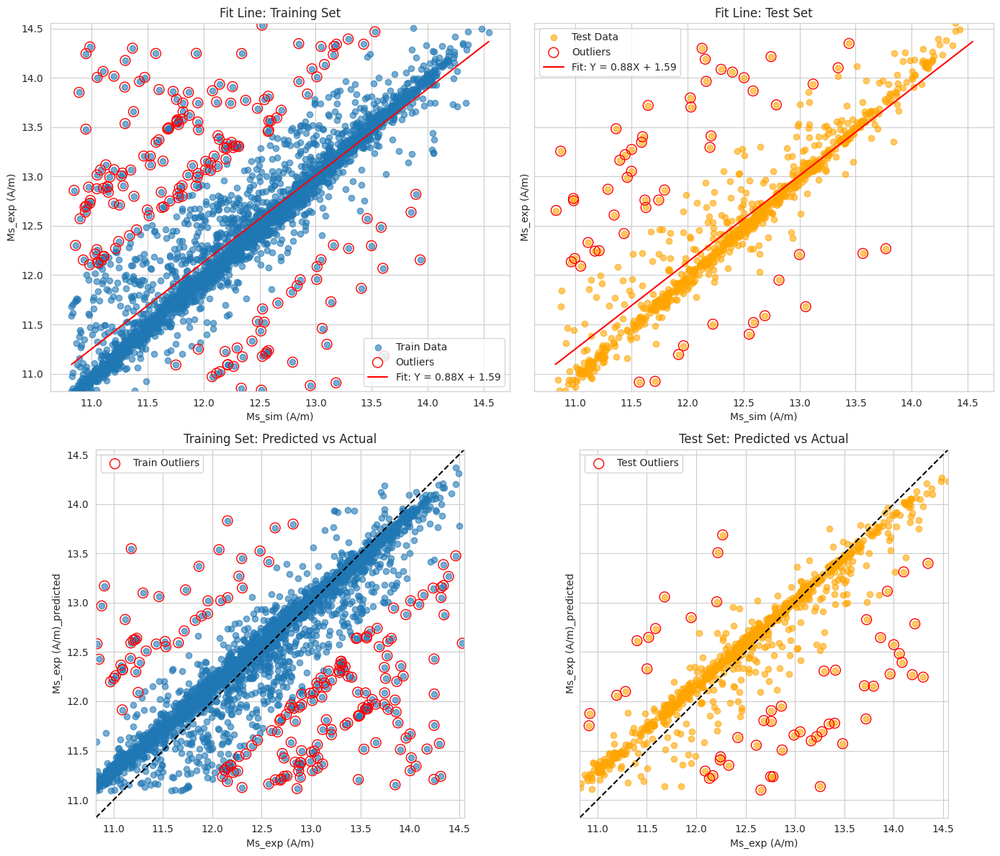

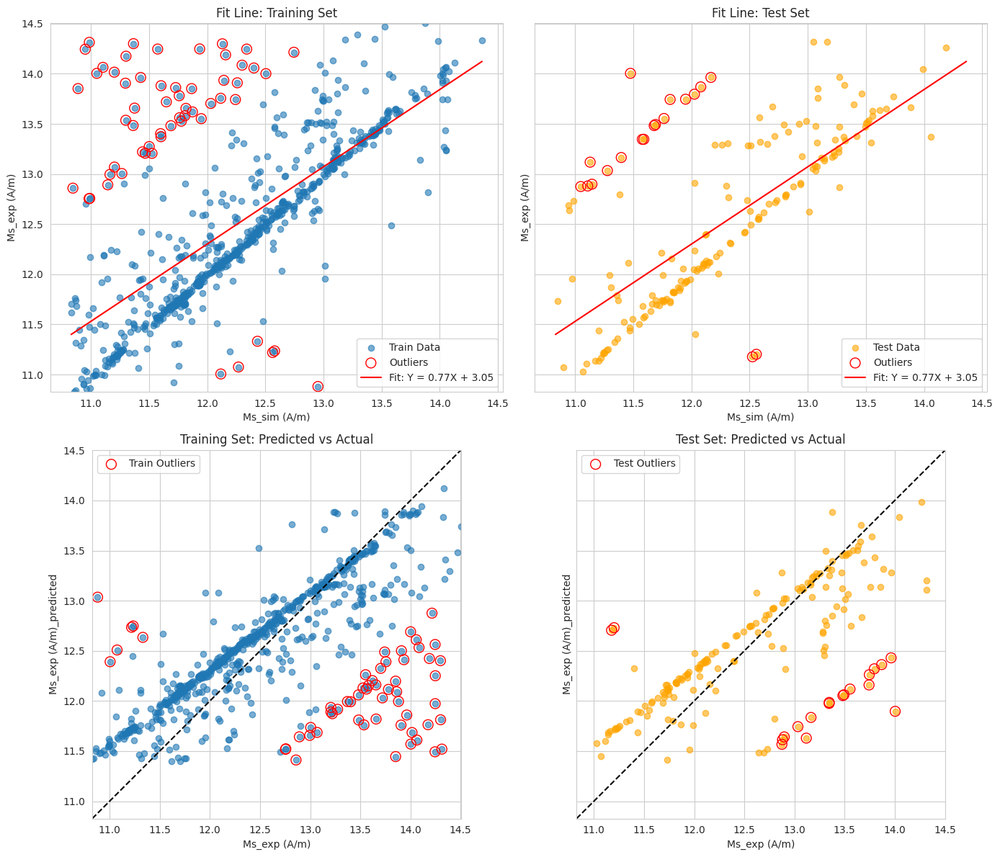

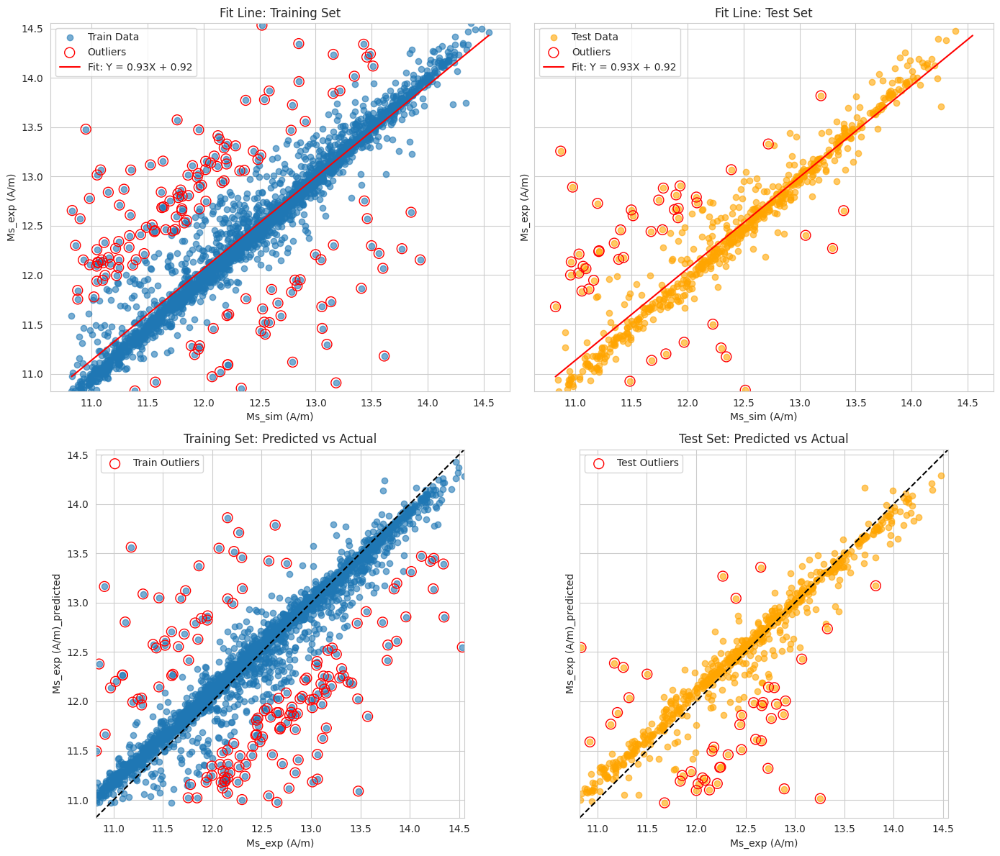

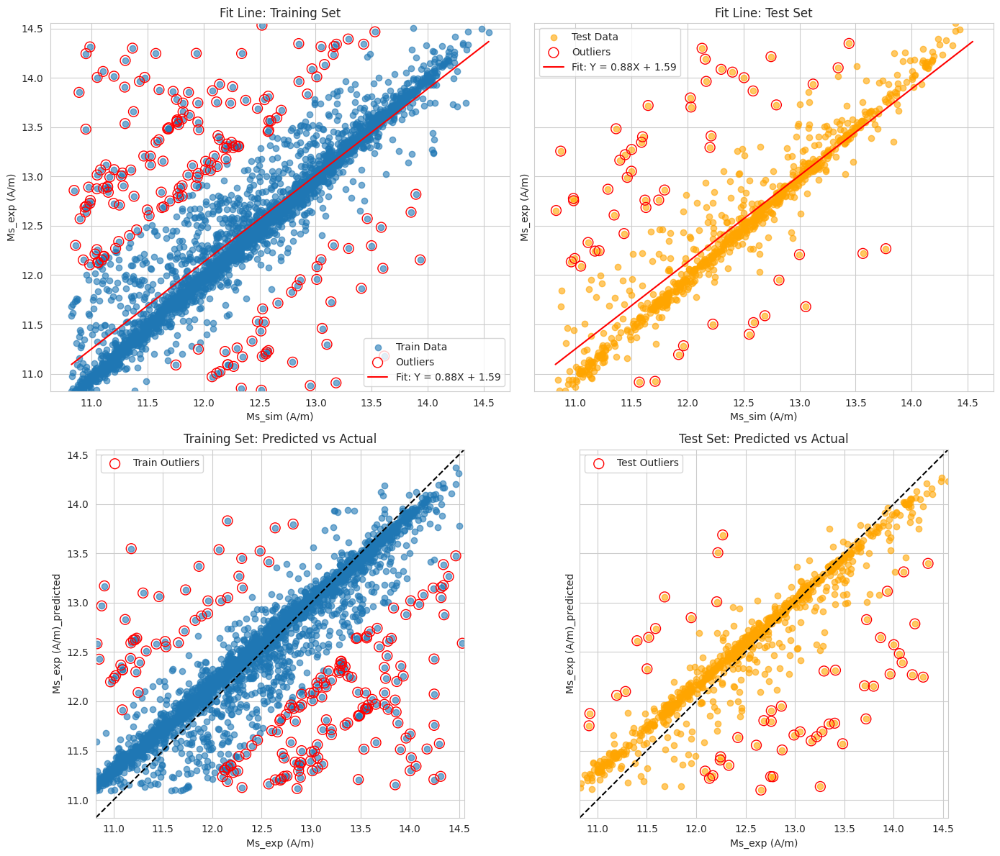

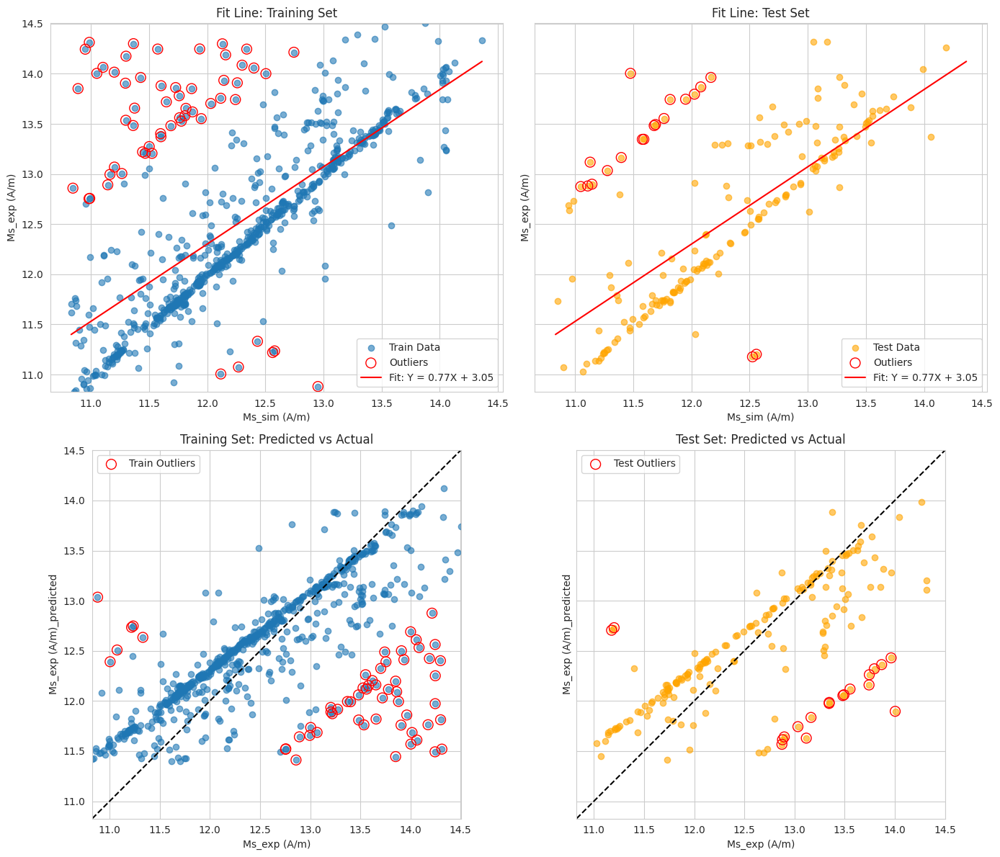

...

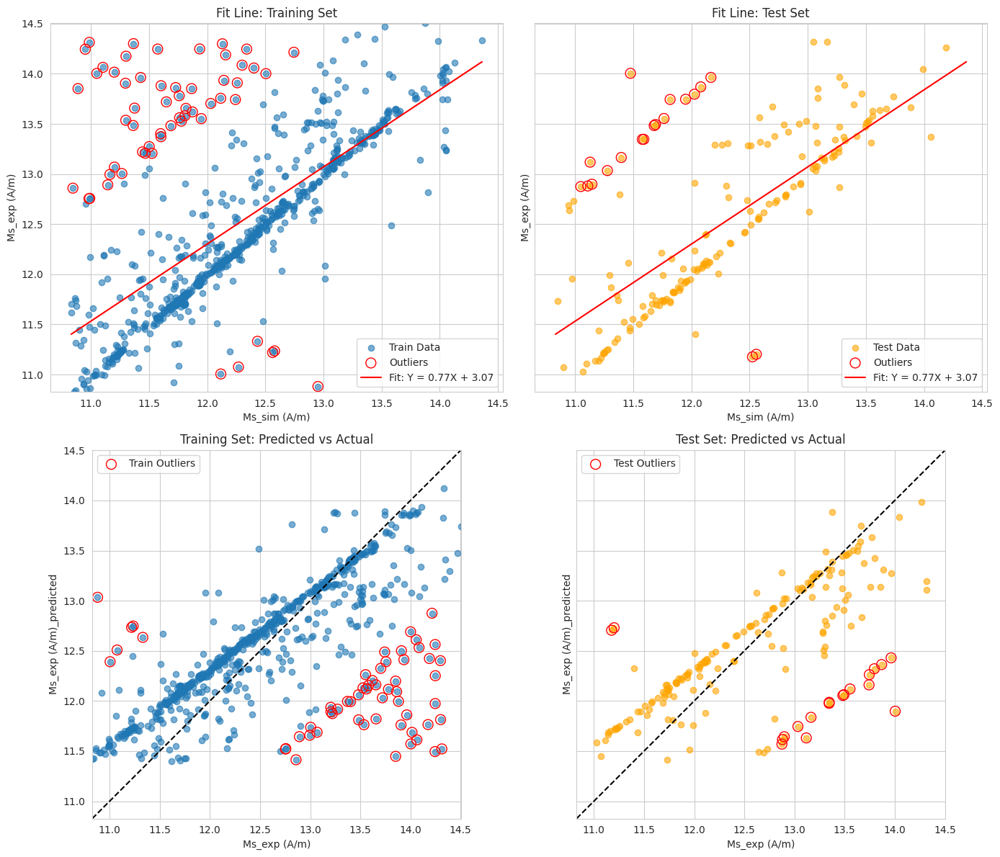

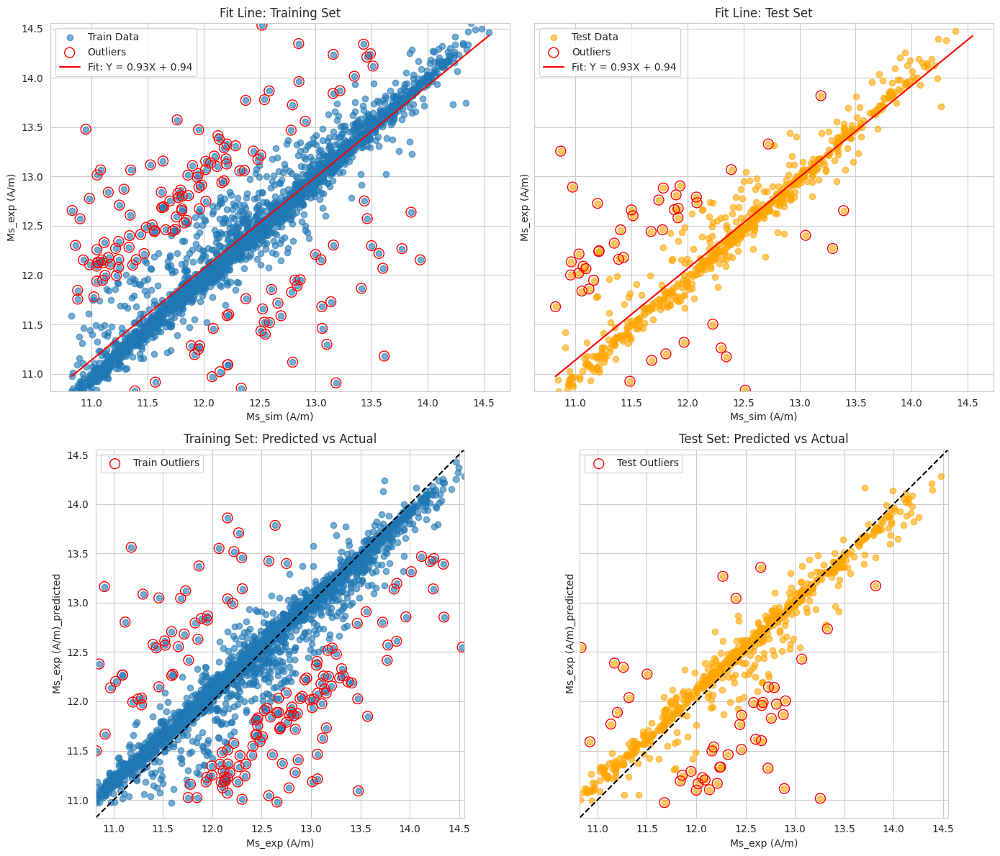

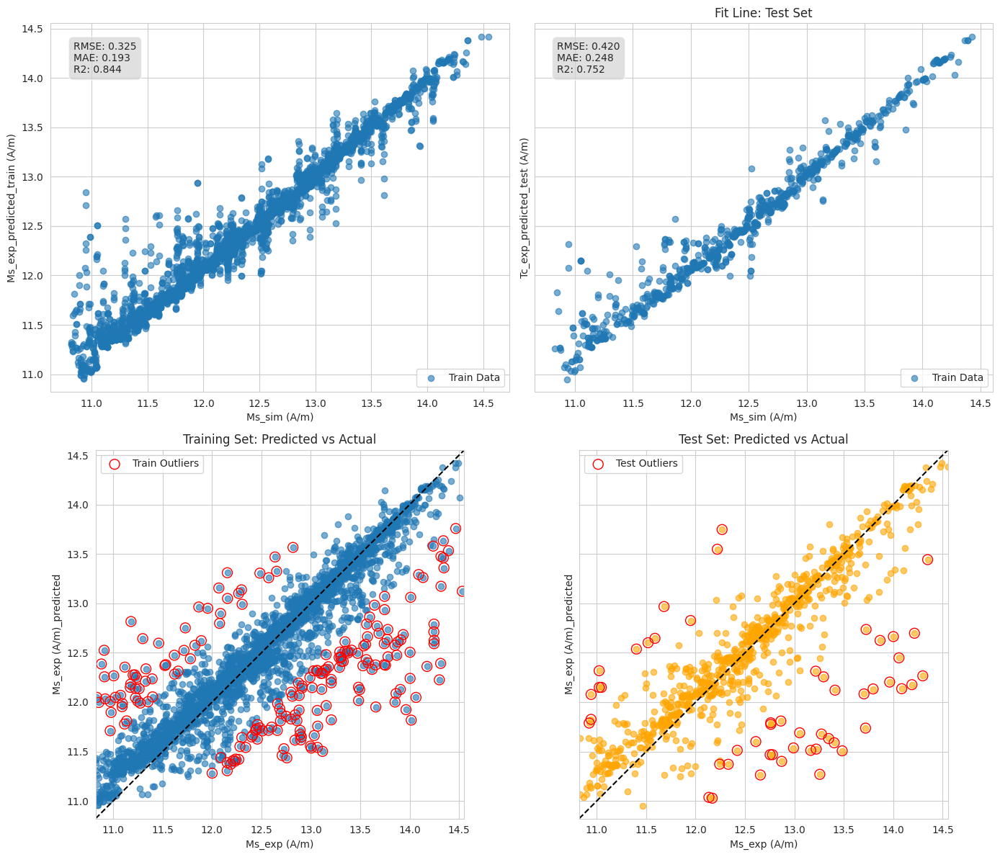

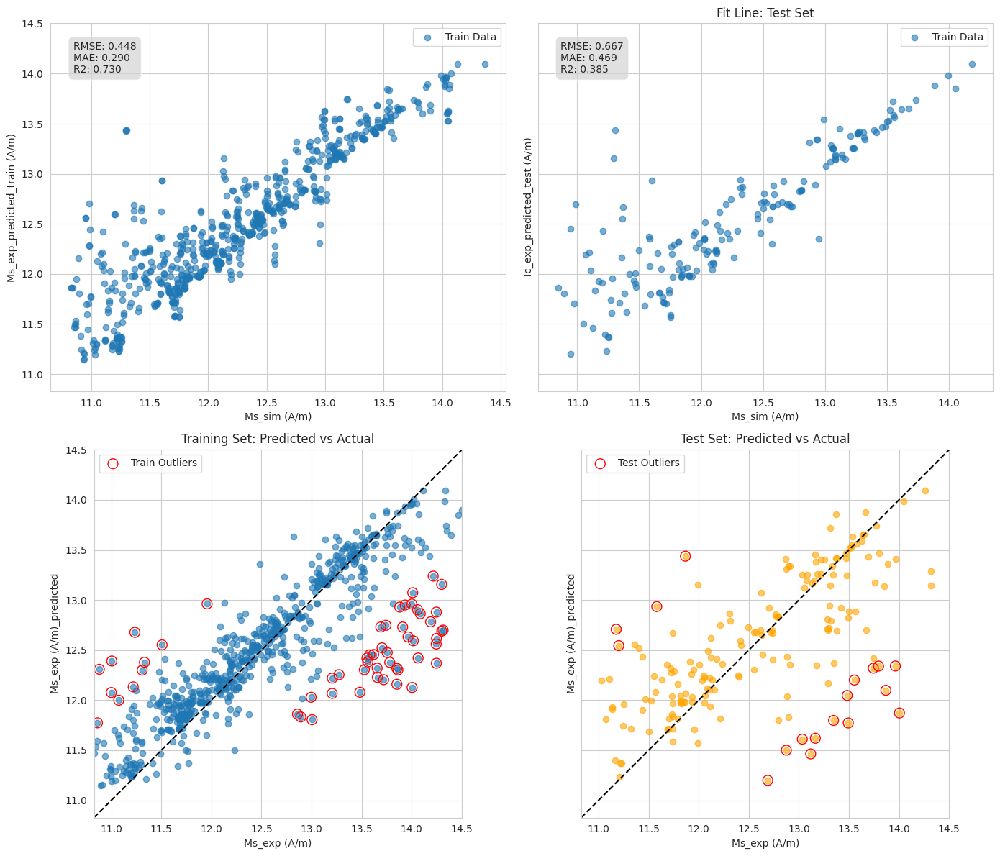

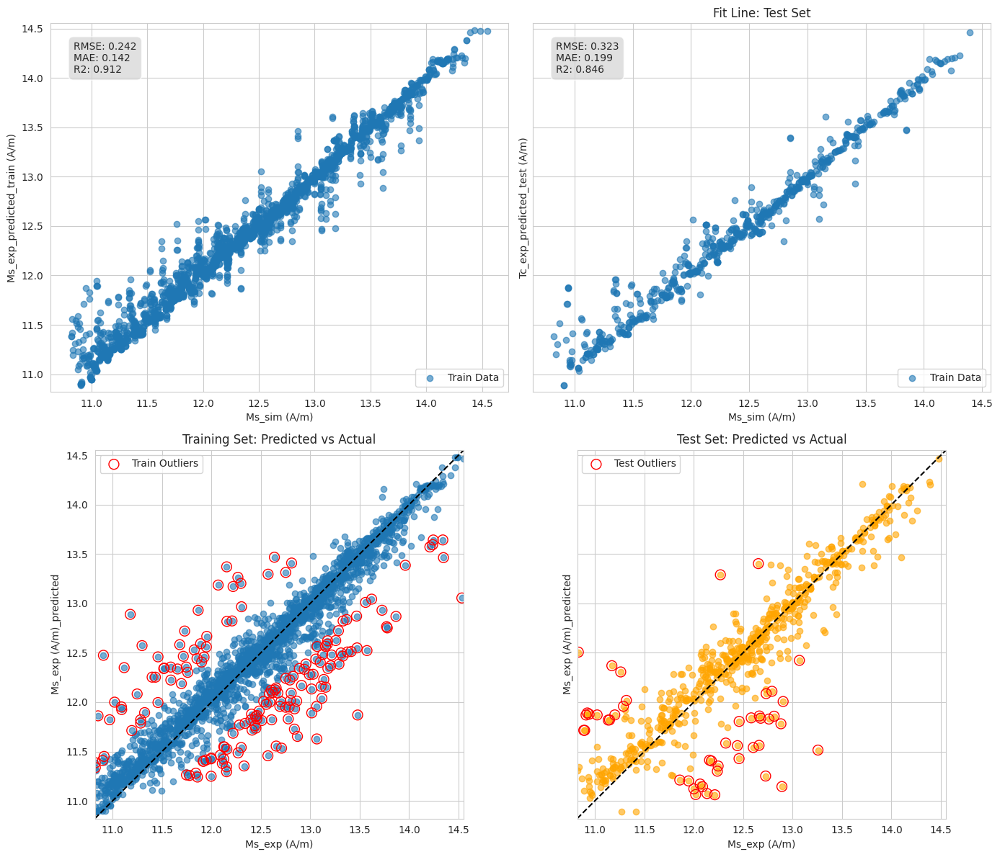

In [8]:
scikit_configfile_path = 'configs/scikit_models_config.yml'

with open(scikit_configfile_path, "r") as f:
    scikit_config = yaml.safe_load(f)   

run_all_experiments(config=scikit_config)

#### Symbolic Regression

In [9]:
pysr_configfile_path = 'configs/pysr_linear_models_config.yml'

with open(pysr_configfile_path, "r") as f:
    pysr_config = yaml.safe_load(f)   

run_all_experiments(config=pysr_config)

Running model: symbolic_regression
➤ Dataset: all


/home/christina-winkler/Projects/ML-models/ml-models/lib/python3.12/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
Compiling Julia backend...
[ Info: Started!



Expressions evaluated per second: 6.990e+04
Progress: 1987 / 3100 total iterations (64.097%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           1.829e-01  0.000e+00  y = x₀
3           1.763e-01  1.821e-02  y = x₀ + 0.080913
5           1.666e-01  2.823e-02  y = (x₀ * 0.87902) + 1.5805
7           1.651e-01  4.476e-03  y = (x₀ * (x₀ * 0.035326)) + 7.0279
9           1.650e-01  6.005e-04  y = (x₀ * ((x₀ * 0.057601) + -0.56581)) + 10.603
11          1.649e-01  1.484e-04  y = ((x₀ * -0.41977) + ((x₀ * x₀) * 0.052233)) + 9.6193
13          1.649e-01  1.735e-05  y = (((x₀ + -0.0042215) * (x₀ * 0.052233)) + (x₀ * -0.4197...
                                      7)) + 9.6241
17          1.649e-01  4.470e-08  y = ((x₀ * (((0.19559 * -0.24531) + x₀) + 0.043918)) * 0.0...
                     

[ Info: Final population:
[ Info: Results saved to:


───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           1.829e-01  0.000e+00  y = x₀
3           1.763e-01  1.821e-02  y = x₀ + 0.080913
5           1.666e-01  2.824e-02  y = (x₀ * 0.87902) + 1.5813
7           1.651e-01  4.468e-03  y = (x₀ * (x₀ * 0.035326)) + 7.0279
9           1.650e-01  6.005e-04  y = (x₀ * ((x₀ * 0.057601) + -0.56581)) + 10.603
11          1.649e-01  1.638e-04  y = (((x₀ * x₀) * 0.052233) + 9.622) + (x₀ * -0.41977)
13          1.649e-01  2.664e-05  y = ((x₀ + -0.16787) * -0.59375) + ((x₀ * (x₀ * 0.059291))...
                                       + 10.592)
15          1.646e-01  9.793e-04  y = x₀ + ((((x₀ + -13.203) + ((x₀ * -0.025347) * x₀)) * x₀...
                                      ) + 58.336)
17          1.644e-01  4.318e-04  y = (x₀ * -13.29) + ((x₀ + (x₀ * (((x₀ * -0.025137) * x₀) ...
                                      + x₀))) + 59.008)
19          1.644

/home/christina-winkler/Projects/ML-models/ml-models/lib/python3.12/site-packages/pysr/sr.py:2217: UserWarning: The discovered expressions are being reset. Please set `warm_start=True` if you wish to continue to start a search where you left off.
  warnings.warn(
/home/christina-winkler/Projects/ML-models/ml-models/lib/python3.12/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 3.130e+05
Progress: 2177 / 3100 total iterations (70.226%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           4.698e-01  0.000e+00  y = x₀
3           4.110e-01  6.685e-02  y = x₀ + 0.2426
5           3.788e-01  4.086e-02  y = (x₀ + 4.0311) * 0.76737
7           3.767e-01  2.742e-03  y = ((x₀ * x₀) * 0.030975) + 7.8223
9           3.753e-01  1.869e-03  y = (x₀ * ((x₀ * 0.093129) + -1.5433)) + 17.368
11          3.752e-01  4.214e-05  y = (((x₀ * 0.077331) + -0.91497) * (x₀ + -2.98)) + 12.147
13          3.717e-01  4.748e-03  y = (((((x₀ * -0.074402) + 2.8612) * x₀) + -35.784) * x₀) ...
                                      + 158.2
15          3.714e-01  3.592e-04  y = (x₀ + (x₀ * ((((x₀ * -0.097364) + 3.7075) * x₀) + -47....
                          

[ Info: Final population:
[ Info: Results saved to:


➤ Dataset: re_free
  - outputs/20260130_114114_3PnJPY/hall_of_fame.csv


/home/christina-winkler/Projects/ML-models/ml-models/lib/python3.12/site-packages/pysr/sr.py:2217: UserWarning: The discovered expressions are being reset. Please set `warm_start=True` if you wish to continue to start a search where you left off.
  warnings.warn(
/home/christina-winkler/Projects/ML-models/ml-models/lib/python3.12/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 9.910e+04
Progress: 2323 / 3100 total iterations (74.935%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           1.005e-01  0.000e+00  y = x₀
3           9.939e-02  5.316e-03  y = x₀ + 0.032589
5           9.604e-02  1.714e-02  y = (x₀ + 0.96565) * 0.93054
7           9.533e-02  3.731e-03  y = ((x₀ * x₀) * 0.037188) + 6.6942
9           9.533e-02  9.835e-07  y = (((x₀ * x₀) + 0.0096045) * 0.037188) + 6.6942
11          9.533e-02  1.490e-07  y = (((x₀ * (x₀ + -0.34367)) + x₀) * 0.036241) + 6.5465
13          9.533e-02  2.682e-07  y = 6.1147 + ((((-0.032434 + (x₀ * x₀)) * -0.030134) + -0....
                                      47038) * -1.2342)
15          9.533e-02  7.153e-07  y = ((((x₀ + -1.146) * 0.015416) + ((x₀ * x₀) + -0.15244))...
              

[ Info: Final population:
[ Info: Results saved to:



 All experiments completed. Log saved to:
 artifacts/experiment-log_sim2exp-pysr_linear-2026-01-30T11-40-58/result_logs.yml


({},
 'artifacts/experiment-log_sim2exp-pysr_linear-2026-01-30T11-40-58/result_logs.yml')

  - outputs/20260130_114122_chFRV8/hall_of_fame.csv


#### Multi-Layer Perceptron

In [10]:
mlp_configfile_path = 'configs/pytorch_mlp_config.yml'

with open(mlp_configfile_path, "r") as f:
    mlp_config = yaml.safe_load(f)   

run_all_experiments(config=mlp_config)

Running model: pytorch_mlp
➤ Dataset: all

Best architecture: None
Best params: None
Best val loss: inf
Best metrics: None
Epoch [0/2000], Train Loss: 182.2669, Val Loss: 170.9986
Epoch [1/2000], Train Loss: 170.2999, Val Loss: 159.6140
Epoch [2/2000], Train Loss: 158.9544, Val Loss: 149.2936
Epoch [3/2000], Train Loss: 148.6715, Val Loss: 140.0166
Epoch [4/2000], Train Loss: 139.4269, Val Loss: 131.1706
Epoch [5/2000], Train Loss: 130.6120, Val Loss: 122.7192
Epoch [6/2000], Train Loss: 122.1902, Val Loss: 114.6590
Epoch [7/2000], Train Loss: 114.1589, Val Loss: 106.9161
Epoch [8/2000], Train Loss: 106.4439, Val Loss: 99.4452
Epoch [9/2000], Train Loss: 99.0002, Val Loss: 92.3795
Epoch [10/2000], Train Loss: 91.9604, Val Loss: 85.8796
Epoch [11/2000], Train Loss: 85.4846, Val Loss: 79.6203
Epoch [12/2000], Train Loss: 79.2491, Val Loss: 73.8460
Epoch [13/2000], Train Loss: 73.4972, Val Loss: 68.3783
Epoch [14/2000], Train Loss: 68.0505, Val Loss: 63.3029
Epoch [15/2000], Train Loss: 6

({},
 'artifacts/experiment-log_sim2exp-pytorch-2026-01-30T11-41-29/result_logs.yml')

#### Scikit models with composition embedding

Embedding compositions: 100%|██████████| 4225/4225 [00:01<00:00, 3160.88it/s]



 Embedding generation complete.
Successes: 4225
Failures: 0
Missing embeddings in dataframe: 0
Running model: LinearRegression
➤ Dataset: all
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re_free
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
Running model: Ridge
➤ Dataset: all
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.004, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re_free
Fitting 3 folds for eac

({},
 'artifacts/experiment-mat200log_sim2exp-scikit-2026-01-30T11-41-34/result_logs.yml')

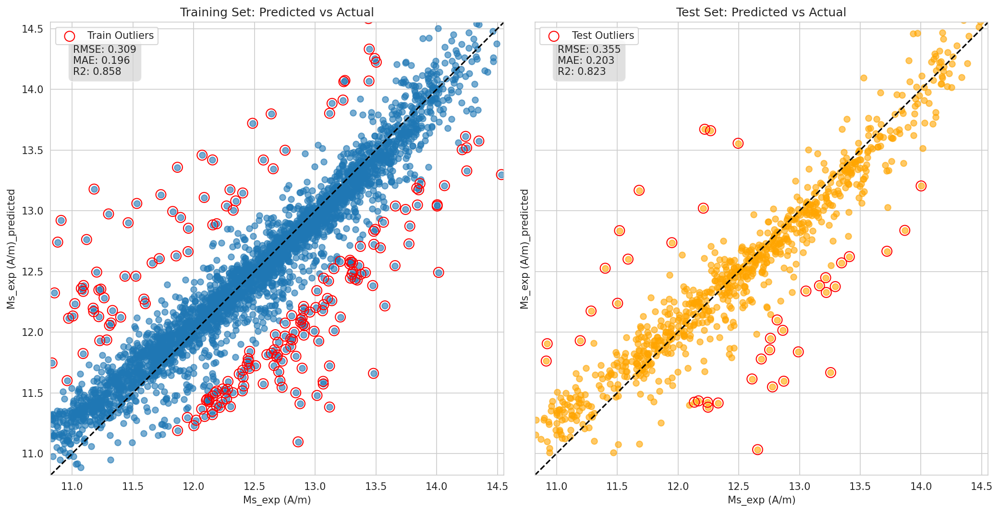

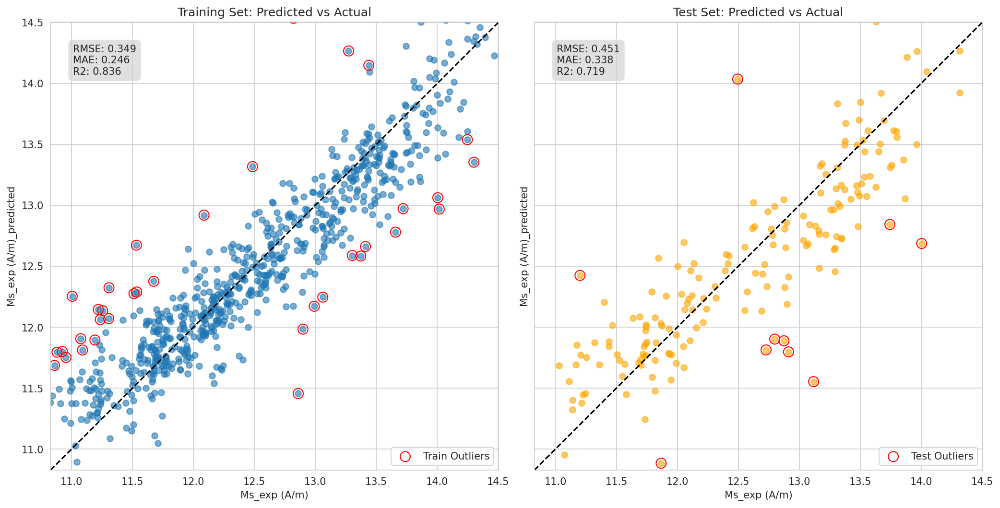

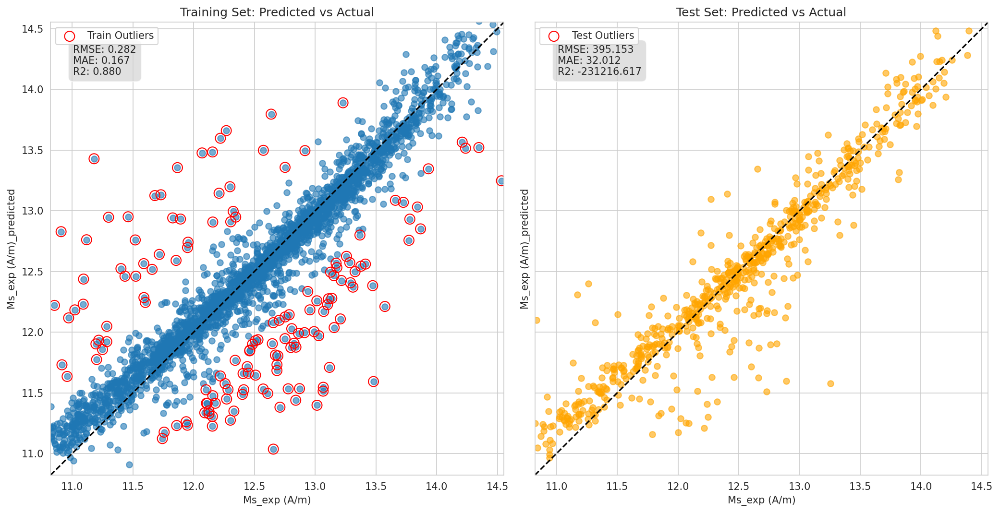

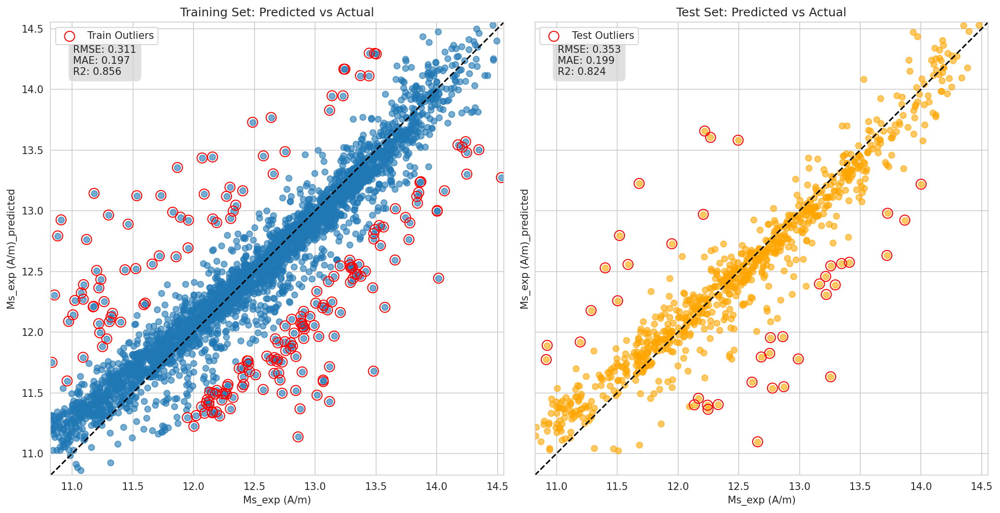

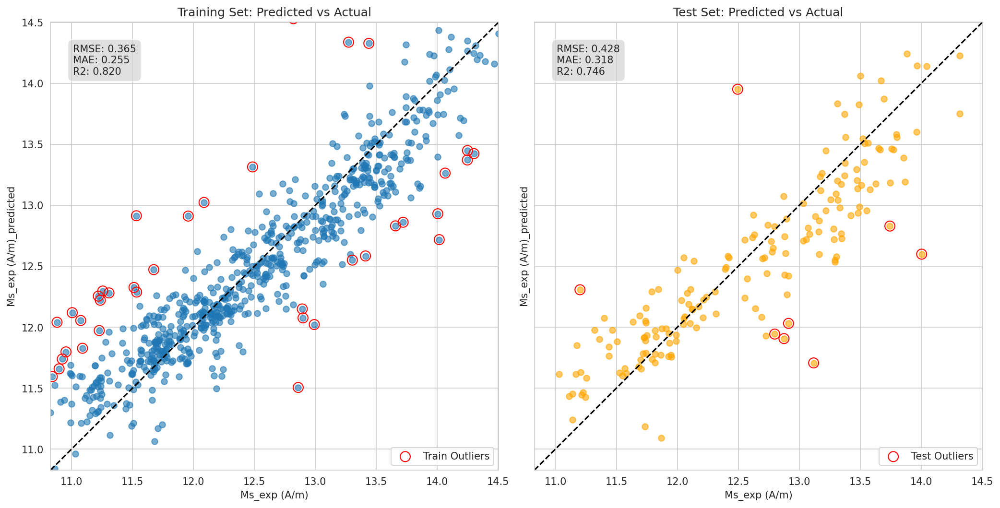

...

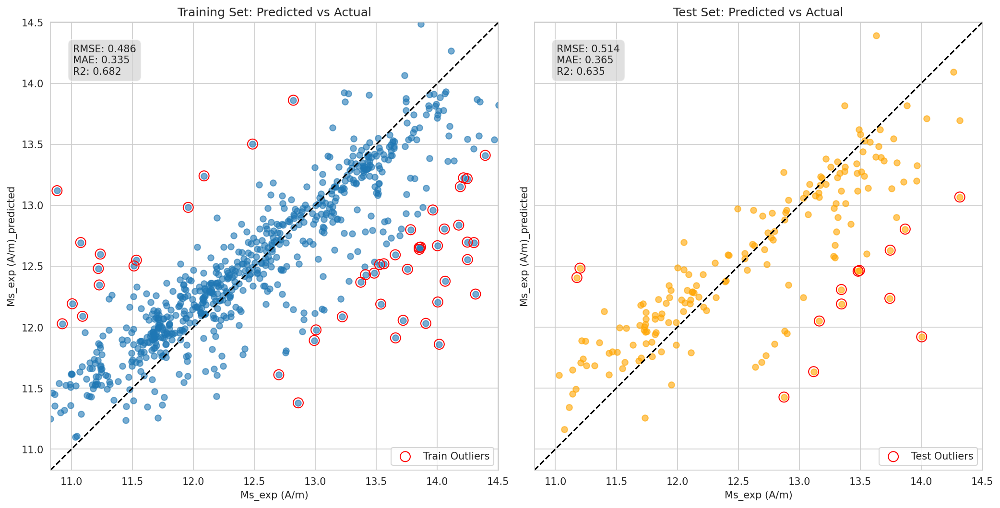

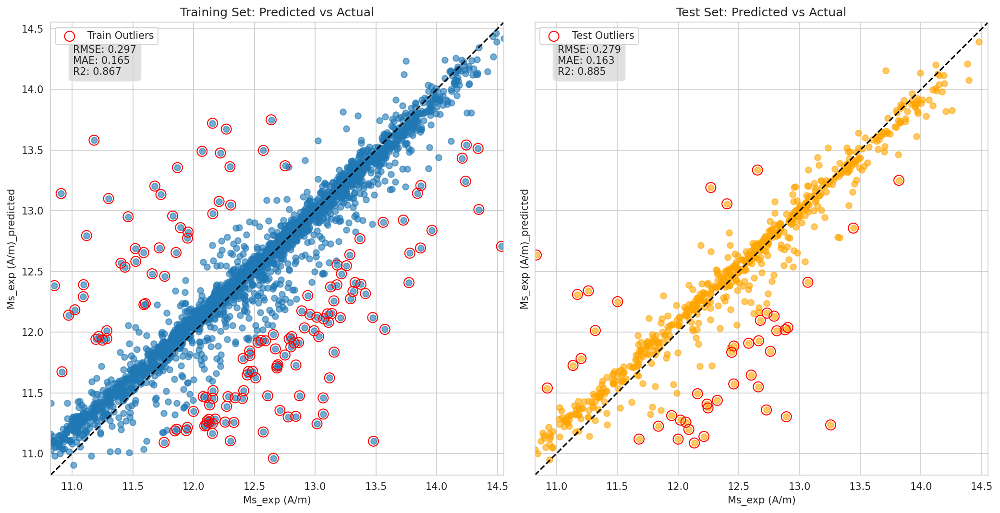

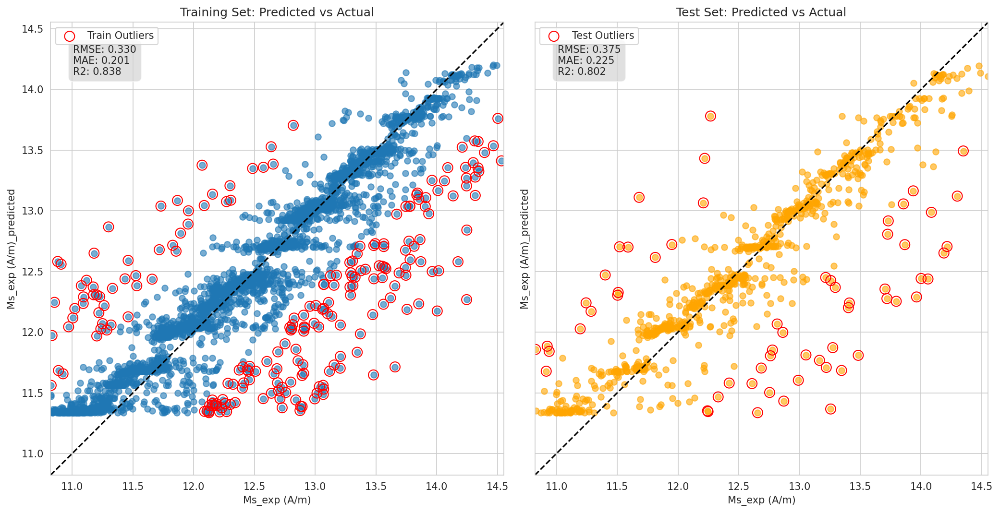

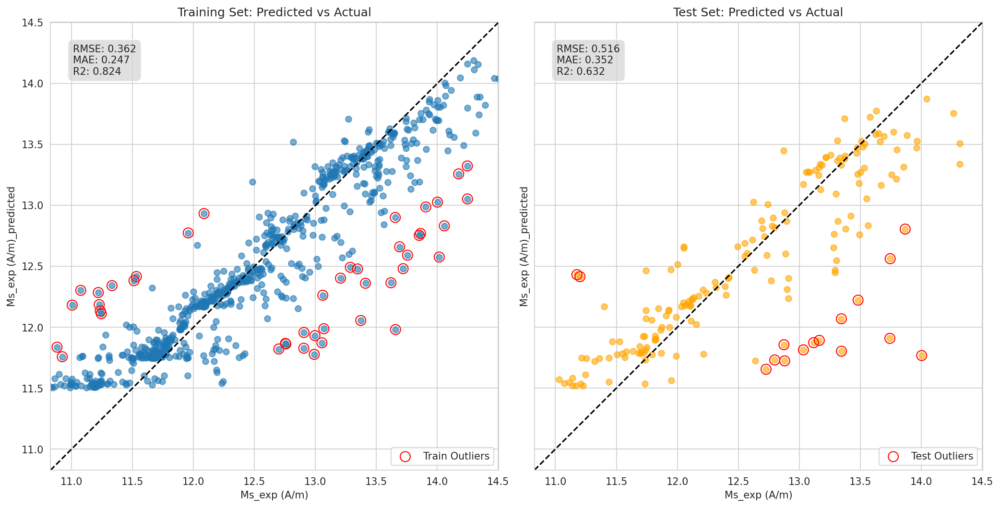

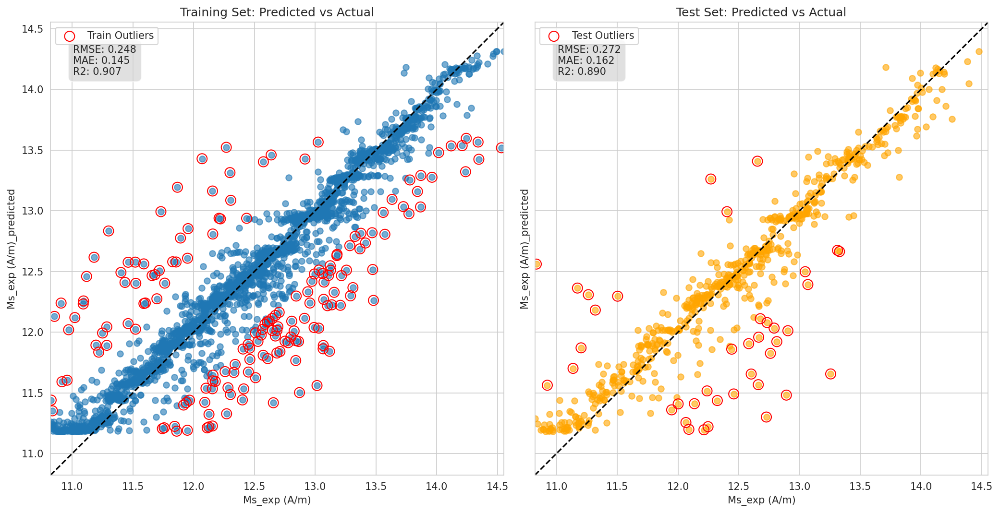

In [11]:
scikit_w_embd_configfile_path = 'configs/scikit_models_w_mat200_config.yml'

with open(scikit_w_embd_configfile_path, "r") as f:
    scikit_w_embd_config = yaml.safe_load(f)   

run_all_experiments(config=scikit_w_embd_config)

#### Multi-Layer Perceptron with composition embedding

In [12]:
mlp_w_embd_configfile_path = 'configs/pytorch_mlp_w_emb_config.yml'

with open(mlp_w_embd_configfile_path, "r") as f:
    mlp_w_embd_config = yaml.safe_load(f)   

run_all_experiments(config=mlp_w_embd_config)

Embedding compositions: 100%|██████████| 4225/4225 [00:01<00:00, 2982.13it/s]



 Embedding generation complete.
Successes: 4225
Failures: 0
Missing embeddings in dataframe: 0
Running model: pytorch_mlp
➤ Dataset: all

Best architecture: None
Best params: None
Best val loss: inf
Best metrics: None
Epoch [0/2000], Train Loss: 154.8640, Val Loss: 154.4081
Epoch [1/2000], Train Loss: 153.7681, Val Loss: 153.2724
Epoch [2/2000], Train Loss: 152.6365, Val Loss: 152.1459
Epoch [3/2000], Train Loss: 151.5142, Val Loss: 151.0218
Epoch [4/2000], Train Loss: 150.3940, Val Loss: 149.8705
Epoch [5/2000], Train Loss: 149.2467, Val Loss: 148.6935
Epoch [6/2000], Train Loss: 148.0740, Val Loss: 147.4888
Epoch [7/2000], Train Loss: 146.8737, Val Loss: 146.2545
Epoch [8/2000], Train Loss: 145.6440, Val Loss: 144.9887
Epoch [9/2000], Train Loss: 144.3829, Val Loss: 143.6944
Epoch [10/2000], Train Loss: 143.0931, Val Loss: 142.3676
Epoch [11/2000], Train Loss: 141.7713, Val Loss: 141.0138
Epoch [12/2000], Train Loss: 140.4231, Val Loss: 139.6694
Epoch [13/2000], Train Loss: 139.0831

({},
 'artifacts/experiment-mat200_logsim2exp-pytorch-2026-01-30T11-42-58/result_logs.yml')